In [1]:
import numpy as np
import matplotlib.pyplot as plt
import gym
import pickle as pkl
import wandb
import pandas as pd
import os
import seaborn as sns

from extension.samplers import NelderMead, ApproximateNelderMead, IncompleteNelderMead
from copy import deepcopy
from pyDOE import lhs
from itertools import combinations, permutations
from sklearn.metrics.pairwise import cosine_similarity
from stable_baselines3.ppo import PPO
from stable_baselines3.common.env_util import make_vec_env, SubprocVecEnv
import matplotlib.patches as patches
from matplotlib.pyplot import get_cmap
from matplotlib.ticker import MaxNLocator

In [2]:
# NOTE: this is ugly? Yes
folder_path_nm = 'data/NM/80k_default'
files_nm = os.listdir(folder_path_nm)
all_data_nm = []

for folder_number, method_folder in enumerate(files_nm):
    file_path = os.path.join(folder_path_nm, method_folder)
    print(os.listdir(file_path))
    for file in os.listdir(file_path):    
        file_path_data = os.path.join(file_path, file)
        with open(file_path_data, 'rb') as f:
            content = pkl.load(f, encoding='latin1')
            all_data_nm.append(content)

folder_path_inm = 'data/INM'
files_inm = os.listdir(folder_path_inm)
all_data_inm = []
for folder_number, method_folder in enumerate(files_inm):
    file_path = os.path.join(folder_path_inm, method_folder)
    print(os.listdir(file_path))
    for file in os.listdir(file_path):    
        file_path_data = os.path.join(file_path, file)
        with open(file_path_data, 'rb') as f:
            content = pkl.load(f, encoding='latin1')
            all_data_inm.append(content)

folder_path_anm_w = 'data/ANM/weights'
files_anm_w = os.listdir(folder_path_anm_w)
all_data_anm_w = []
for folder_number, method_folder in enumerate(files_anm_w):
    file_path = os.path.join(folder_path_anm_w, method_folder)
    print(os.listdir(file_path))
    for file in os.listdir(file_path):    
        file_path_data = os.path.join(file_path, file)
        with open(file_path_data, 'rb') as f:
            content = pkl.load(f, encoding='latin1')
            all_data_anm_w.append(content)

folder_path_anm_d = 'data/ANM/distance'
files_anm_d = os.listdir(folder_path_anm_d)
all_data_anm_d = []
for folder_number, method_folder in enumerate(files_anm_d):
    file_path = os.path.join(folder_path_anm_d, method_folder)
    print(os.listdir(file_path))
    for file in os.listdir(file_path):    
        file_path_data = os.path.join(file_path, file)
        with open(file_path_data, 'rb') as f:
            content = pkl.load(f, encoding='latin1')
            all_data_anm_d.append(content)

['best_fitnesses.pkl', 'rewards.pkl', 'fitnesses.pkl', 'count_operations.pkl', 'init_points.pkl', 'best_solution.pkl', 'best_rewards.pkl', 'solutions.pkl']
['best_fitnesses.pkl', 'rewards.pkl', 'fitnesses.pkl', 'count_operations.pkl', 'init_points.pkl', 'best_solution.pkl', 'best_rewards.pkl', 'solutions.pkl']
['best_fitnesses.pkl', 'rewards.pkl', 'fitnesses.pkl', 'count_operations.pkl', 'init_points.pkl', 'best_solution.pkl', 'best_rewards.pkl', 'solutions.pkl']
['best_fitnesses.pkl', 'rewards.pkl', 'fitnesses.pkl', 'count_operations.pkl', 'init_points.pkl', 'best_solution.pkl', 'best_rewards.pkl', 'solutions.pkl']
['best_fitnesses.pkl', 'rewards.pkl', 'fitnesses.pkl', 'count_operations.pkl', 'init_points.pkl', 'best_solution.pkl', 'best_rewards.pkl', 'solutions.pkl']
['best_fitnesses.pkl', 'rewards.pkl', 'fitnesses.pkl', 'count_operations.pkl', 'init_points.pkl', 'best_solution.pkl', 'best_rewards.pkl', 'solutions.pkl']
['best_fitnesses.pkl', 'rewards.pkl', 'fitnesses.pkl', 'count_op

In [3]:
best_fitnesses_nm = np.array([all_data_nm[i] for i in np.arange(0, 40, 8)])
rewards_nm = np.array([all_data_nm[i] for i in np.arange(1, 40, 8)])
fitnesses_nm = np.array([all_data_nm[i] for i in np.arange(2, 40, 8)])
count_operations_nm = np.array([all_data_nm[i] for i in np.arange(3, 40, 8)])
init_points_nm = np.array([all_data_nm[i] for i in np.arange(4, 40, 8)])
best_solutions_nm = np.array([all_data_nm[i] for i in np.arange(5, 40, 8)])
best_rewards_nm = np.array([all_data_nm[i] for i in np.arange(6, 40, 8)])
solutions_nm = np.array([all_data_nm[i] for i in np.arange(7, 40, 8)])

best_fitnesses_inm = np.array([all_data_inm[i] for i in np.arange(0, 40, 8)])
rewards_inm = np.array([all_data_inm[i] for i in np.arange(1, 40, 8)])
fitnesses_inm = np.array([all_data_inm[i] for i in np.arange(2, 40, 8)])
count_operations_inm = np.array([all_data_inm[i] for i in np.arange(3, 40, 8)])
init_points_inm = np.array([all_data_inm[i] for i in np.arange(4, 40, 8)])
best_solutions_inm = np.array([all_data_inm[i] for i in np.arange(5, 40, 8)])
best_rewards_inm = np.array([all_data_inm[i] for i in np.arange(6, 40, 8)])
solutions_inm = np.array([all_data_inm[i] for i in np.arange(7, 40, 8)])

best_fitnesses_anm_w = np.array([all_data_anm_w[i] for i in np.arange(0, 40, 8)])
rewards_anm_w = np.array([all_data_anm_w[i] for i in np.arange(1, 40, 8)])
fitnesses_anm_w = np.array([all_data_anm_w[i] for i in np.arange(2, 40, 8)])
count_operations_anm_w = np.array([all_data_anm_w[i] for i in np.arange(3, 40, 8)])
init_points_anm_w = np.array([all_data_anm_w[i] for i in np.arange(4, 40, 8)])
best_solutions_anm_w = np.array([all_data_anm_w[i] for i in np.arange(5, 40, 8)])
best_rewards_anm_w = np.array([all_data_anm_w[i] for i in np.arange(6, 40, 8)])
solutions_anm_w = np.array([all_data_anm_w[i] for i in np.arange(7, 40, 8)])

best_fitnesses_anm_d = np.array([all_data_anm_d[i] for i in np.arange(0, 40, 8)])
rewards_anm_d = np.array([all_data_anm_d[i] for i in np.arange(1, 40, 8)])
fitnesses_anm_d = np.array([all_data_anm_d[i] for i in np.arange(2, 40, 8)])
count_operations_anm_d = np.array([all_data_anm_d[i] for i in np.arange(3, 40, 8)])
init_points_anm_d = np.array([all_data_anm_d[i] for i in np.arange(4, 40, 8)])
best_solutions_anm_d = np.array([all_data_anm_d[i] for i in np.arange(5, 40, 8)])
best_rewards_anm_d = np.array([all_data_anm_d[i] for i in np.arange(6, 40, 8)])
solutions_anm_d = np.array([all_data_anm_d[i] for i in np.arange(7, 40, 8)])

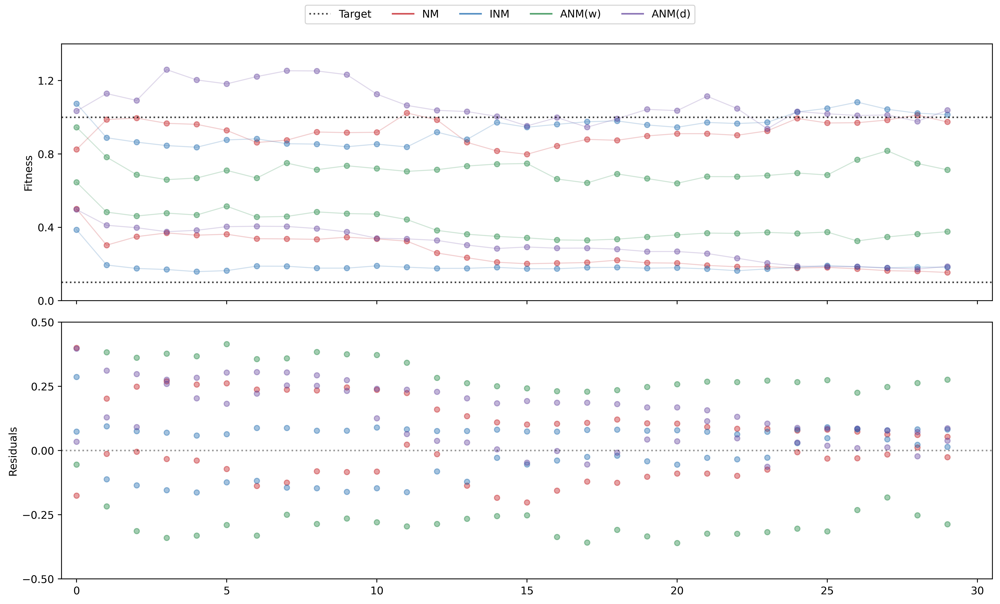

In [4]:
fig, ax = plt.subplots(2, 1, figsize=(14, 8), sharex=True, dpi=500)

ax[0].plot(np.mean(np.mean(solutions_nm, axis = 0), axis = 1), c=get_cmap('Reds')(200), linewidth=1, alpha = 0.2)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_nm, axis = 0), axis = 1)[:, 0], color=get_cmap('Reds')(200), s=25, alpha = 0.4)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_nm, axis = 0), axis = 1)[:, 1], color=get_cmap('Reds')(200), s=25, alpha = 0.4)

ax[0].plot(np.mean(np.mean(solutions_inm, axis = 0), axis = 1), c=get_cmap('Blues')(200), linewidth=1, alpha = 0.2)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_inm, axis = 0), axis = 1)[:, 0], color=get_cmap('Blues')(200), s=25, alpha = 0.4)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_inm, axis = 0), axis = 1)[:, 1], color=get_cmap('Blues')(200), s=25, alpha = 0.4)

ax[0].plot(np.mean(np.mean(solutions_anm_w, axis = 0), axis = 1), c=get_cmap('Greens')(200), linewidth=1, alpha = 0.2)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_anm_w, axis = 0), axis = 1)[:, 0], color=get_cmap('Greens')(200), s=25, alpha = 0.4)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_anm_w, axis = 0), axis = 1)[:, 1], color=get_cmap('Greens')(200), s=25, alpha = 0.4)

ax[0].plot(np.mean(np.mean(solutions_anm_d, axis = 0), axis = 1), c=get_cmap('Purples')(200), linewidth=1, alpha = 0.2)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_anm_d, axis = 0), axis = 1)[:, 0], color=get_cmap('Purples')(200), s=25, alpha = 0.4)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_anm_d, axis = 0), axis = 1)[:, 1], color=get_cmap('Purples')(200), s=25, alpha = 0.4)

ax[0].hlines(1.0, -0.5, 30.5, colors='black', linestyles='dotted', alpha = 0.75, label = 'Target')
ax[0].hlines(0.1, -0.5, 30.5, colors='black', linestyles='dotted', alpha = 0.75)

ax[0].plot([-5, -4], [-100, -99], c=get_cmap('Reds')(200), label='NM', alpha = 0.75)
ax[0].plot([-5, -4], [-100, -99], c=get_cmap('Blues')(200), label='INM', alpha = 0.75)
ax[0].plot([-5, -4], [-100, -99], c=get_cmap('Greens')(200), label='ANM(w)', alpha = 0.75)
ax[0].plot([-5, -4], [-100, -99], c=get_cmap('Purples')(200), label='ANM(d)', alpha = 0.75)

ax[0].set_xlim(-0.5, 30.5)
ax[0].set_ylim(0, 1.4)
# ax[0].set_xscale('symlog')

residuals_0_nm = np.mean(np.mean(solutions_nm, axis = 0), axis = 1)[:, 0] - 1
residuals_1_nm = np.mean(np.mean(solutions_nm, axis = 0), axis = 1)[:, 1] - 0.1
residuals_0_inm = np.mean(np.mean(solutions_inm, axis = 0), axis = 1)[:, 0] - 1
residuals_1_inm = np.mean(np.mean(solutions_inm, axis = 0), axis = 1)[:, 1] - 0.1
residuals_0_anm_w = np.mean(np.mean(solutions_anm_w, axis = 0), axis = 1)[:, 0] - 1
residuals_1_anm_w = np.mean(np.mean(solutions_anm_w, axis = 0), axis = 1)[:, 1] - 0.1
residuals_0_anm_d = np.mean(np.mean(solutions_anm_d, axis = 0), axis = 1)[:, 0] - 1
residuals_1_anm_d = np.mean(np.mean(solutions_anm_d, axis = 0), axis = 1)[:, 1] - 0.1

ax[1].scatter(np.arange(30), residuals_0_nm, color=get_cmap('Reds')(200), s=25, alpha = 0.4)
ax[1].scatter(np.arange(30), residuals_1_nm, color=get_cmap('Reds')(200), s=25, alpha = 0.4)
ax[1].scatter(np.arange(30), residuals_0_inm, color=get_cmap('Blues')(200), s=25, alpha = 0.4)
ax[1].scatter(np.arange(30), residuals_1_inm, color=get_cmap('Blues')(200), s=25, alpha = 0.4)
ax[1].scatter(np.arange(30), residuals_0_anm_w, color=get_cmap('Greens')(200), s=25, alpha = 0.4)
ax[1].scatter(np.arange(30), residuals_1_anm_w, color=get_cmap('Greens')(200), s=25, alpha = 0.4)
ax[1].scatter(np.arange(30), residuals_0_anm_d, color=get_cmap('Purples')(200), s=25, alpha = 0.4)
ax[1].scatter(np.arange(30), residuals_1_anm_d, color=get_cmap('Purples')(200), s=25, alpha = 0.4)
ax[1].hlines(0, -0.5, 31, colors='black', linestyles='dotted', alpha = 0.4)
ax[1].set_xlim(-0.5, 30.5)
ax[1].set_ylim(-0.5, 0.5)
# ax[1].set_xscale('symlog')
ax[0].yaxis.set_major_locator(MaxNLocator(4))
ax[1].yaxis.set_major_locator(MaxNLocator(4))
ax[0].set_ylabel('Fitness')
ax[1].set_ylabel('Residuals')
handles, labels = ax[0].get_legend_handles_labels()
fig.legend(handles, labels, ncols = 5, loc='upper center')
fig.tight_layout(rect=(0,0,0.95,0.95))

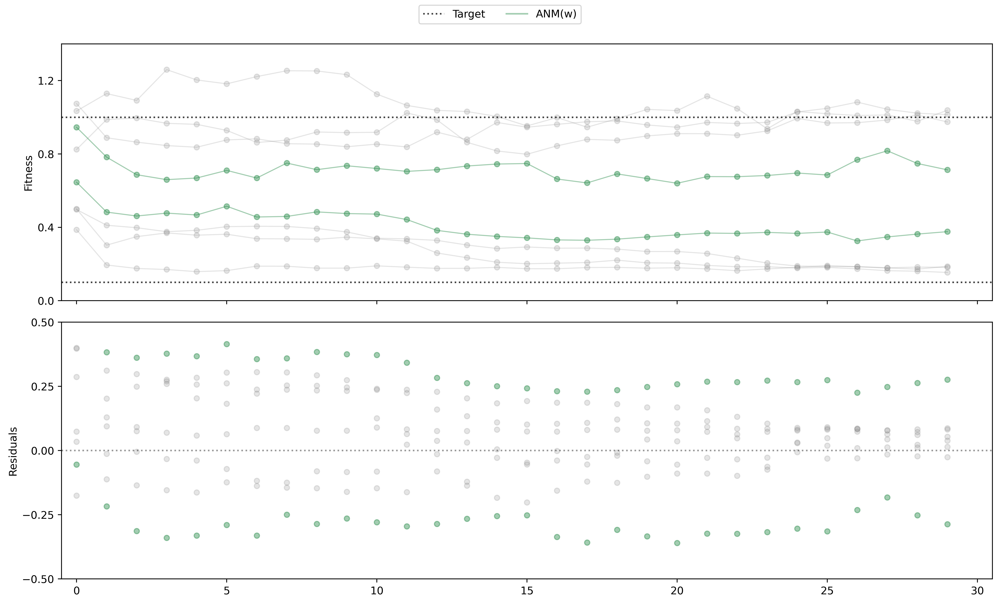

In [5]:
fig, ax = plt.subplots(2, 1, figsize=(14, 8), sharex=True, dpi=500)

ax[0].plot(np.mean(np.mean(solutions_nm, axis = 0), axis = 1), color='gray', linewidth=1, alpha = 0.2)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_nm, axis = 0), axis = 1)[:, 0], color='gray', s=25, alpha = 0.2)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_nm, axis = 0), axis = 1)[:, 1], color='gray', s=25, alpha = 0.2)

ax[0].plot(np.mean(np.mean(solutions_inm, axis = 0), axis = 1), color='gray', linewidth=1, alpha = 0.2)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_inm, axis = 0), axis = 1)[:, 0], color='gray', s=25, alpha = 0.2)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_inm, axis = 0), axis = 1)[:, 1], color='gray', s=25, alpha = 0.2)

ax[0].plot(np.mean(np.mean(solutions_anm_w, axis = 0), axis = 1), color=get_cmap('Greens')(200), linewidth=1, alpha = 0.4)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_anm_w, axis = 0), axis = 1)[:, 0], color=get_cmap('Greens')(200), s=25, alpha = 0.4)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_anm_w, axis = 0), axis = 1)[:, 1], color=get_cmap('Greens')(200), s=25, alpha = 0.4)

ax[0].plot(np.mean(np.mean(solutions_anm_d, axis = 0), axis = 1), color='gray', linewidth=1, alpha = 0.2)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_anm_d, axis = 0), axis = 1)[:, 0], color='gray', s=25, alpha = 0.2)
ax[0].scatter(np.arange(30), np.mean(np.mean(solutions_anm_d, axis = 0), axis = 1)[:, 1], color='gray', s=25, alpha = 0.2)

ax[0].hlines(1.0, -0.5, 30.5, colors='black', linestyles='dotted', alpha = 0.75, label = 'Target')
ax[0].hlines(0.1, -0.5, 30.5, colors='black', linestyles='dotted', alpha = 0.75)

ax[0].plot([-5, -4], [-100, -99], color=get_cmap('Greens')(200), label='ANM(w)', alpha = 0.4)

ax[0].set_xlim(-0.5, 30.5)
ax[0].set_ylim(0, 1.4)
# ax[0].set_xscale('symlog')

residuals_0_nm = np.mean(np.mean(solutions_nm, axis = 0), axis = 1)[:, 0] - 1
residuals_1_nm = np.mean(np.mean(solutions_nm, axis = 0), axis = 1)[:, 1] - 0.1
residuals_0_inm = np.mean(np.mean(solutions_inm, axis = 0), axis = 1)[:, 0] - 1
residuals_1_inm = np.mean(np.mean(solutions_inm, axis = 0), axis = 1)[:, 1] - 0.1
residuals_0_anm_w = np.mean(np.mean(solutions_anm_w, axis = 0), axis = 1)[:, 0] - 1
residuals_1_anm_w = np.mean(np.mean(solutions_anm_w, axis = 0), axis = 1)[:, 1] - 0.1
residuals_0_anm_d = np.mean(np.mean(solutions_anm_d, axis = 0), axis = 1)[:, 0] - 1
residuals_1_anm_d = np.mean(np.mean(solutions_anm_d, axis = 0), axis = 1)[:, 1] - 0.1

ax[1].scatter(np.arange(30), residuals_0_nm, color='gray', s=25, alpha = 0.2)
ax[1].scatter(np.arange(30), residuals_1_nm, color='gray', s=25, alpha = 0.2)
ax[1].scatter(np.arange(30), residuals_0_inm, color='gray', s=25, alpha = 0.2)
ax[1].scatter(np.arange(30), residuals_1_inm, color='gray', s=25, alpha = 0.2)
ax[1].scatter(np.arange(30), residuals_0_anm_w, color=get_cmap('Greens')(200), s=25, alpha = 0.4)
ax[1].scatter(np.arange(30), residuals_1_anm_w, color=get_cmap('Greens')(200), s=25, alpha = 0.4)
ax[1].scatter(np.arange(30), residuals_0_anm_d, color='gray', s=25, alpha = 0.2)
ax[1].scatter(np.arange(30), residuals_1_anm_d, color='gray', s=25, alpha = 0.2)
ax[1].hlines(0, -0.5, 31, colors='black', linestyles='dotted', alpha = 0.4)
ax[1].set_xlim(-0.5, 30.5)
ax[1].set_ylim(-0.5, 0.5)
ax[0].yaxis.set_major_locator(MaxNLocator(4))
ax[1].yaxis.set_major_locator(MaxNLocator(4))
ax[0].set_ylabel('Fitness')
ax[1].set_ylabel('Residuals')
handles, labels = ax[0].get_legend_handles_labels()
fig.legend(handles, labels, ncols = 2, loc='upper center')
fig.tight_layout(rect=(0,0,0.95,0.95))

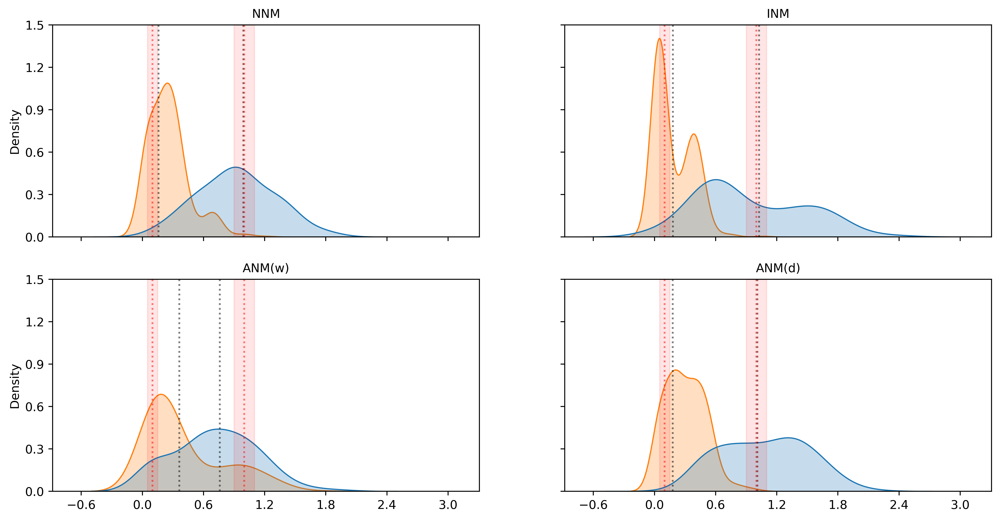

In [6]:
fig, ax = plt.subplots(2, 2, figsize=(14, 7), sharex=True, sharey=True, dpi=500)

sns.kdeplot(solutions_nm.reshape(-1, 2), ax=ax[0, 0], fill=True, bw_adjust=1.5, legend=False)
ax[0, 0].vlines(solutions_nm[..., 0][:, 27:, :].mean(), 0, 1.5, colors='black', linestyles='dotted', alpha = 0.5)
ax[0, 0].vlines(1, 0, 1.5, colors='red', linestyles='dotted', alpha = 0.5)
ax[0, 0].fill_betweenx([0, 1.5], 0.9, 1.1, color='red', alpha=0.1)
ax[0, 0].vlines(solutions_nm[..., 1][:, 27:, :].mean(), 0, 1.5, colors='black', linestyles='dotted', alpha = 0.5)
ax[0, 0].vlines(0.1, 0, 1.5, colors='red', linestyles='dotted', alpha = 0.5)
ax[0, 0].fill_betweenx([0, 1.5], 0.05, 0.15, color='red', alpha=0.1)
ax[0, 0].set_title('NNM', fontsize=10)
ax[0, 0].set_ylim(0, 1.5)

sns.kdeplot(solutions_inm.reshape(-1, 2), ax=ax[0, 1], fill=True, bw_adjust=1.5, legend=False)
ax[0, 1].vlines(solutions_inm[..., 0][:, 27:, :].mean(), 0, 1.5, colors='black', linestyles='dotted', alpha = 0.5)
ax[0, 1].vlines(1, 0, 1.5, colors='red', linestyles='dotted', alpha = 0.5)
ax[0, 1].fill_betweenx([0, 1.5], 0.9, 1.1, color='red', alpha=0.1)
ax[0, 1].vlines(solutions_inm[..., 1][:, 27:, :].mean(), 0, 1.5, colors='black', linestyles='dotted', alpha = 0.5)
ax[0, 1].vlines(0.1, 0, 1.5, colors='red', linestyles='dotted', alpha = 0.5)
ax[0, 1].fill_betweenx([0, 1.5], 0.05, 0.15, color='red', alpha=0.1)
ax[0, 1].set_title('INM', fontsize=10)

sns.kdeplot(solutions_anm_w.reshape(-1, 2), ax=ax[1, 0], fill=True, bw_adjust=1.5, legend=False)
ax[1, 0].vlines(solutions_anm_w[..., 0][:, 27:, :].mean(), 0, 1.5, colors='black', linestyles='dotted', alpha = 0.5)
ax[1, 0].vlines(1, 0, 1.5, colors='red', linestyles='dotted', alpha = 0.5)
ax[1, 0].fill_betweenx([0, 1.5], 0.9, 1.1, color='red', alpha=0.1)
ax[1, 0].vlines(solutions_anm_w[..., 1][:, 27:, :].mean(), 0, 1.5, colors='black', linestyles='dotted', alpha = 0.5)
ax[1, 0].vlines(0.1, 0, 1.5, colors='red', linestyles='dotted', alpha = 0.5)
ax[1, 0].fill_betweenx([0, 1.5], 0.05, 0.15, color='red', alpha=0.1)
ax[1, 0].set_title('ANM(w)', fontsize=10)

sns.kdeplot(solutions_anm_d.reshape(-1, 2), ax=ax[1, 1], fill=True, bw_adjust=1.5, legend=False)
ax[1, 1].vlines(solutions_anm_d[..., 0][:, 27:, :].mean(), 0, 1.5, colors='black', linestyles='dotted', alpha = 0.5)
ax[1, 1].vlines(1, 0, 1.5, colors='red', linestyles='dotted', alpha = 0.5)
ax[1, 1].fill_betweenx([0, 1.5], 0.9, 1.1, color='red', alpha=0.1)
ax[1, 1].vlines(solutions_anm_d[..., 1][:, 27:, :].mean(), 0, 1.5, colors='black', linestyles='dotted', alpha = 0.5)
ax[1, 1].vlines(0.1, 0, 1.5, colors='red', linestyles='dotted', alpha = 0.5)
ax[1, 1].fill_betweenx([0, 1.5], 0.05, 0.15, color='red', alpha=0.1)
ax[1, 1].set_title('ANM(d)', fontsize=10)

ax[0, 0].xaxis.set_major_locator(MaxNLocator(8))
ax[0, 1].xaxis.set_major_locator(MaxNLocator(8))
ax[1, 0].xaxis.set_major_locator(MaxNLocator(8))
ax[1, 1].xaxis.set_major_locator(MaxNLocator(8))
ax[0, 0].yaxis.set_major_locator(MaxNLocator(5))
ax[0, 1].yaxis.set_major_locator(MaxNLocator(5))
ax[1, 0].yaxis.set_major_locator(MaxNLocator(5))
ax[1, 1].yaxis.set_major_locator(MaxNLocator(5))

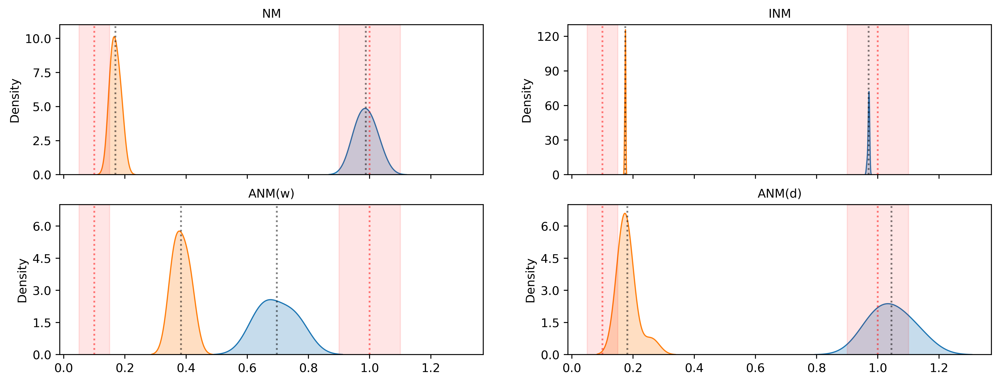

In [7]:
fig, ax = plt.subplots(2, 2, figsize=(14, 5), dpi=500, sharex=True)
sns.kdeplot(best_solutions_nm.mean(axis = 0)[20:], ax=ax[0, 0], fill=True, bw_adjust=1.5, legend=False)
ax[0, 0].set_title('NM', fontsize=10)
ax[0, 0].vlines(1, 0, 11, colors='red', linestyles='dotted', alpha = 0.5)
ax[0, 0].vlines(0.1, 0, 11, colors='red', linestyles='dotted', alpha = 0.5)
ax[0, 0].fill_betweenx([0, 11], 0.9, 1.1, color='red', alpha=0.1)
ax[0, 0].fill_betweenx([0, 11], 0.05, 0.15, color='red', alpha=0.1)
ax[0, 0].vlines(best_solutions_nm.mean(axis = 0)[20:, 0].mean(), 0, 11, colors='black', linestyles='dotted', alpha = 0.5)
ax[0, 0].vlines(best_solutions_nm.mean(axis = 0)[20:, 1].mean(), 0, 11, colors='black', linestyles='dotted', alpha = 0.5)
ax[0, 0].set_ylim(0, 11)

sns.kdeplot(best_solutions_inm.mean(axis = 0)[20:], ax=ax[0, 1], fill=True, bw_adjust=1.5, legend=False)
ax[0, 1].set_title('INM', fontsize=10)
ax[0, 1].vlines(1, 0, 130, colors='red', linestyles='dotted', alpha = 0.5)
ax[0, 1].vlines(0.1, 0, 130, colors='red', linestyles='dotted', alpha = 0.5)
ax[0, 1].fill_betweenx([0, 130], 0.9, 1.1, color='red', alpha=0.1)
ax[0, 1].fill_betweenx([0, 130], 0.05, 0.15, color='red', alpha=0.1)
ax[0, 1].vlines(best_solutions_inm.mean(axis = 0)[20:, 0].mean(), 0, 130, colors='black', linestyles='dotted', alpha = 0.5)
ax[0, 1].vlines(best_solutions_inm.mean(axis = 0)[20:, 1].mean(), 0, 130, colors='black', linestyles='dotted', alpha = 0.5)
ax[0, 1].set_ylim(0, 130)

sns.kdeplot(best_solutions_anm_w.mean(axis = 0)[20:], ax=ax[1, 0], fill=True, bw_adjust=1.5, legend=False)
ax[1, 0].set_title('ANM(w)', fontsize=10)
ax[1, 0].vlines(1, 0, 7, colors='red', linestyles='dotted', alpha = 0.5)
ax[1, 0].vlines(0.1, 0, 7, colors='red', linestyles='dotted', alpha = 0.5)
ax[1, 0].fill_betweenx([0, 7], 0.9, 1.1, color='red', alpha=0.1)
ax[1, 0].fill_betweenx([0, 7], 0.05, 0.15, color='red', alpha=0.1)
ax[1, 0].vlines(best_solutions_anm_w.mean(axis = 0)[20:, 0].mean(), 0, 7, colors='black', linestyles='dotted', alpha = 0.5)
ax[1, 0].vlines(best_solutions_anm_w.mean(axis = 0)[20:, 1].mean(), 0, 7, colors='black', linestyles='dotted', alpha = 0.5)
ax[1, 0].set_ylim(0, 7)

sns.kdeplot(best_solutions_anm_d.mean(axis = 0)[20:], ax=ax[1, 1], fill=True, bw_adjust=1.5, legend=False)
ax[1, 1].set_title('ANM(d)', fontsize=10)
ax[1, 1].vlines(1, 0, 7, colors='red', linestyles='dotted', alpha = 0.5)
ax[1, 1].vlines(0.1, 0, 7, colors='red', linestyles='dotted', alpha = 0.5)
ax[1, 1].fill_betweenx([0, 7], 0.9, 1.1, color='red', alpha=0.1)
ax[1, 1].fill_betweenx([0, 7], 0.05, 0.15, color='red', alpha=0.1)
ax[1, 1].vlines(best_solutions_anm_d.mean(axis = 0)[20:, 0].mean(), 0, 7, colors='black', linestyles='dotted', alpha = 0.5)
ax[1, 1].vlines(best_solutions_anm_d.mean(axis = 0)[20:, 1].mean(), 0, 7, colors='black', linestyles='dotted', alpha = 0.5)
ax[1, 1].set_ylim(0, 7)

ax[0, 0].xaxis.set_major_locator(MaxNLocator(8))
ax[0, 1].xaxis.set_major_locator(MaxNLocator(8))
ax[1, 0].xaxis.set_major_locator(MaxNLocator(8))
ax[1, 1].xaxis.set_major_locator(MaxNLocator(8))
ax[0, 0].yaxis.set_major_locator(MaxNLocator(5))
ax[0, 1].yaxis.set_major_locator(MaxNLocator(5))
ax[1, 0].yaxis.set_major_locator(MaxNLocator(5))
ax[1, 1].yaxis.set_major_locator(MaxNLocator(5))

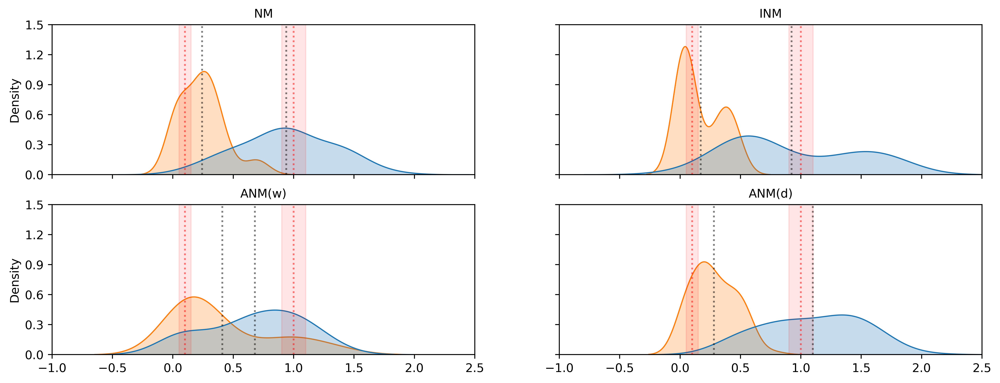

In [8]:
fig, ax = plt.subplots(2, 2, figsize=(14, 5), sharex=True, sharey=True, dpi=500)

sns.kdeplot(best_solutions_nm.reshape(-1, 2), ax=ax[0, 0], fill=True, bw_adjust=1.5, legend=False)
ax[0, 0].set_title('NM', fontsize=10)
ax[0, 0].vlines(1, 0, 11, colors='red', linestyles='dotted', alpha = 0.5)
ax[0, 0].vlines(0.1, 0, 11, colors='red', linestyles='dotted', alpha = 0.5)
ax[0, 0].fill_betweenx([0, 11], 0.9, 1.1, color='red', alpha=0.1)
ax[0, 0].fill_betweenx([0, 11], 0.05, 0.15, color='red', alpha=0.1)
ax[0, 0].vlines(best_solutions_nm.reshape(-1, 2)[:, 0].mean(), 0, 11, colors='black', linestyles='dotted', alpha = 0.5)
ax[0, 0].vlines(best_solutions_nm.reshape(-1, 2)[:, 1].mean(), 0, 11, colors='black', linestyles='dotted', alpha = 0.5)
ax[0, 0].set_ylim(0, 1.5)
ax[0, 0].set_xlim(-1, 2.5)

sns.kdeplot(best_solutions_inm.reshape(-1, 2), ax=ax[0, 1], fill=True, bw_adjust=1.5, legend=False)
ax[0, 1].set_title('INM', fontsize=10)
ax[0, 1].vlines(1, 0, 130, colors='red', linestyles='dotted', alpha = 0.5)
ax[0, 1].vlines(0.1, 0, 130, colors='red', linestyles='dotted', alpha = 0.5)
ax[0, 1].fill_betweenx([0, 130], 0.9, 1.1, color='red', alpha=0.1)
ax[0, 1].fill_betweenx([0, 130], 0.05, 0.15, color='red', alpha=0.1)
ax[0, 1].vlines(best_solutions_inm.reshape(-1, 2)[:, 0].mean(), 0, 130, colors='black', linestyles='dotted', alpha = 0.5)
ax[0, 1].vlines(best_solutions_inm.reshape(-1, 2)[:, 1].mean(), 0, 130, colors='black', linestyles='dotted', alpha = 0.5)

sns.kdeplot(best_solutions_anm_w.reshape(-1, 2), ax=ax[1, 0], fill=True, bw_adjust=1.5, legend=False)
ax[1, 0].set_title('ANM(w)', fontsize=10)
ax[1, 0].vlines(1, 0, 7, colors='red', linestyles='dotted', alpha = 0.5)
ax[1, 0].vlines(0.1, 0, 7, colors='red', linestyles='dotted', alpha = 0.5)
ax[1, 0].fill_betweenx([0, 7], 0.9, 1.1, color='red', alpha=0.1)
ax[1, 0].fill_betweenx([0, 7], 0.05, 0.15, color='red', alpha=0.1)
ax[1, 0].vlines(best_solutions_anm_w.reshape(-1, 2)[:, 0].mean(), 0, 7, colors='black', linestyles='dotted', alpha = 0.5)
ax[1, 0].vlines(best_solutions_anm_w.reshape(-1, 2)[:, 1].mean(), 0, 7, colors='black', linestyles='dotted', alpha = 0.5)

sns.kdeplot(best_solutions_anm_d.reshape(-1, 2), ax=ax[1, 1], fill=True, bw_adjust=1.5, legend=False)
ax[1, 1].set_title('ANM(d)', fontsize=10)
ax[1, 1].vlines(1, 0, 7, colors='red', linestyles='dotted', alpha = 0.5)
ax[1, 1].vlines(0.1, 0, 7, colors='red', linestyles='dotted', alpha = 0.5)
ax[1, 1].fill_betweenx([0, 7], 0.9, 1.1, color='red', alpha=0.1)
ax[1, 1].fill_betweenx([0, 7], 0.05, 0.15, color='red', alpha=0.1)
ax[1, 1].vlines(best_solutions_anm_d.reshape(-1, 2)[:, 0].mean(), 0, 7, colors='black', linestyles='dotted', alpha = 0.5)
ax[1, 1].vlines(best_solutions_anm_d.reshape(-1, 2)[:, 1].mean(), 0, 7, colors='black', linestyles='dotted', alpha = 0.5)

ax[0, 0].xaxis.set_major_locator(MaxNLocator(8))
ax[0, 1].xaxis.set_major_locator(MaxNLocator(8))
ax[1, 0].xaxis.set_major_locator(MaxNLocator(8))
ax[1, 1].xaxis.set_major_locator(MaxNLocator(8))
ax[0, 0].yaxis.set_major_locator(MaxNLocator(5))
ax[0, 1].yaxis.set_major_locator(MaxNLocator(5))
ax[1, 0].yaxis.set_major_locator(MaxNLocator(5))
ax[1, 1].yaxis.set_major_locator(MaxNLocator(5))

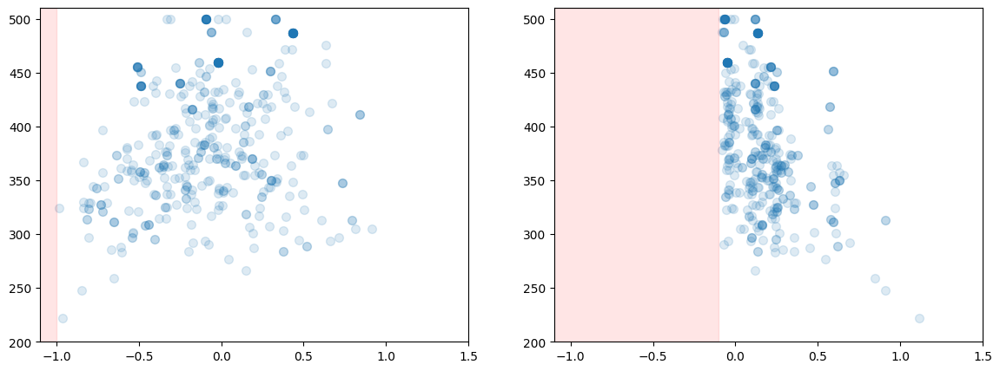

In [116]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].scatter((solutions_nm.reshape(-1, 2)[:, 0] - 1), fitnesses_nm.reshape(450), alpha = 0.15, s=50)
ax[1].scatter((solutions_nm.reshape(-1, 2)[:, 1] - 0.1), fitnesses_nm.reshape(450), alpha = 0.15, s=50)
ax[0].set_xlim(-1.1, 1.5)
ax[1].set_xlim(-1.1, 1.5)
ax[0].set_ylim(200, 510)
ax[1].set_ylim(200, 510)
ax[0].fill_betweenx([200, 510], -2, -1, color='red', alpha=0.1)
ax[1].fill_betweenx([200, 510], -2, -0.1, color='red', alpha=0.1)

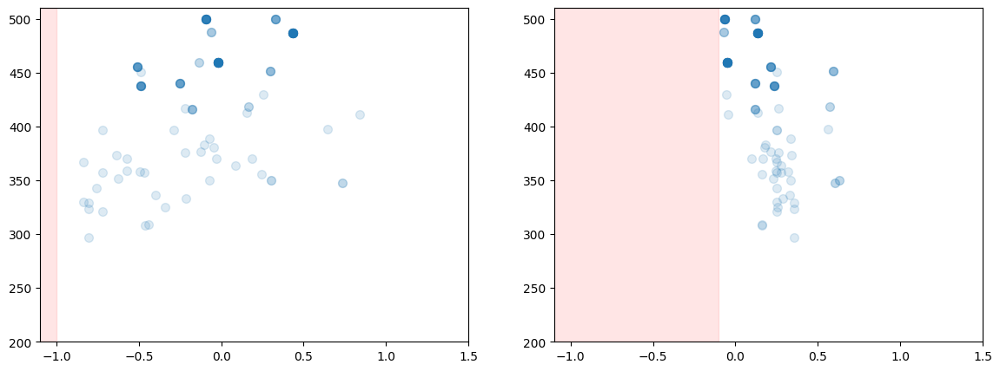

In [125]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].scatter((best_solutions_nm.reshape(-1, 2)[:, 0] - 1), best_fitnesses_nm.reshape(150), alpha = 0.15, s=50)
ax[1].scatter((best_solutions_nm.reshape(-1, 2)[:, 1] - 0.1), best_fitnesses_nm.reshape(150), alpha = 0.15, s=50)
ax[0].set_xlim(-1.1, 1.5)
ax[1].set_xlim(-1.1, 1.5)
ax[0].set_ylim(200, 510)
ax[1].set_ylim(200, 510)
ax[0].fill_betweenx([200, 510], -2, -1, color='red', alpha=0.1)
ax[1].fill_betweenx([200, 510], -2, -0.1, color='red', alpha=0.1)

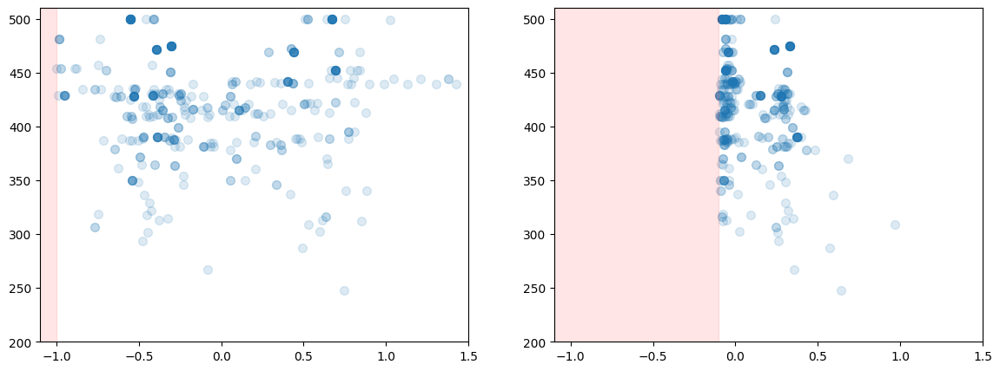

In [126]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].scatter((solutions_inm.reshape(-1, 2)[:, 0] - 1), fitnesses_inm.reshape(450), alpha = 0.15, s=50)
ax[1].scatter((solutions_inm.reshape(-1, 2)[:, 1] - 0.1), fitnesses_inm.reshape(450), alpha = 0.15, s=50)
ax[0].set_xlim(-1.1, 1.5)
ax[1].set_xlim(-1.1, 1.5)
ax[0].set_ylim(200, 510)
ax[1].set_ylim(200, 510)
ax[0].fill_betweenx([200, 510], -2, -1, color='red', alpha=0.1)
ax[1].fill_betweenx([200, 510], -2, -0.1, color='red', alpha=0.1)


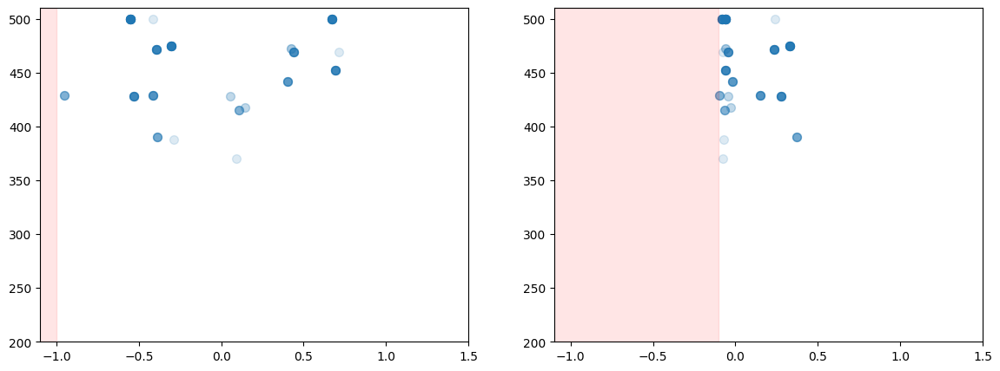

In [128]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].scatter((best_solutions_inm.reshape(-1, 2)[:, 0] - 1), best_fitnesses_inm.reshape(150), alpha = 0.15, s=50)
ax[1].scatter((best_solutions_inm.reshape(-1, 2)[:, 1] - 0.1), best_fitnesses_inm.reshape(150), alpha = 0.15, s=50)
ax[0].set_xlim(-1.1, 1.5)
ax[1].set_xlim(-1.1, 1.5)
ax[0].set_ylim(200, 510)
ax[1].set_ylim(200, 510)
ax[0].fill_betweenx([200, 510], -2, -1, color='red', alpha=0.1)
ax[1].fill_betweenx([200, 510], -2, -0.1, color='red', alpha=0.1)


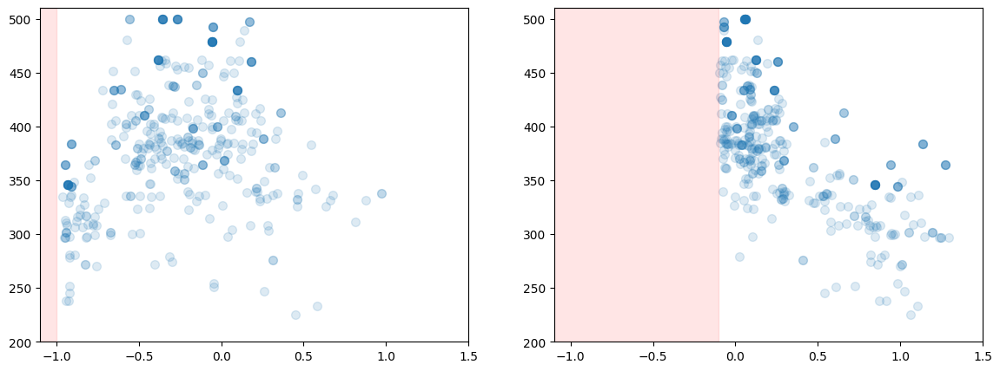

In [129]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].scatter((solutions_anm_w.reshape(-1, 2)[:, 0] - 1), fitnesses_anm_w.reshape(450), alpha = 0.15, s=50)
ax[1].scatter((solutions_anm_w.reshape(-1, 2)[:, 1] - 0.1), fitnesses_anm_w.reshape(450), alpha = 0.15, s=50)
ax[0].set_xlim(-1.1, 1.5)
ax[1].set_xlim(-1.1, 1.5)
ax[0].set_ylim(200, 510)
ax[1].set_ylim(200, 510)
ax[0].fill_betweenx([200, 510], -2, -1, color='red', alpha=0.1)
ax[1].fill_betweenx([200, 510], -2, -0.1, color='red', alpha=0.1)


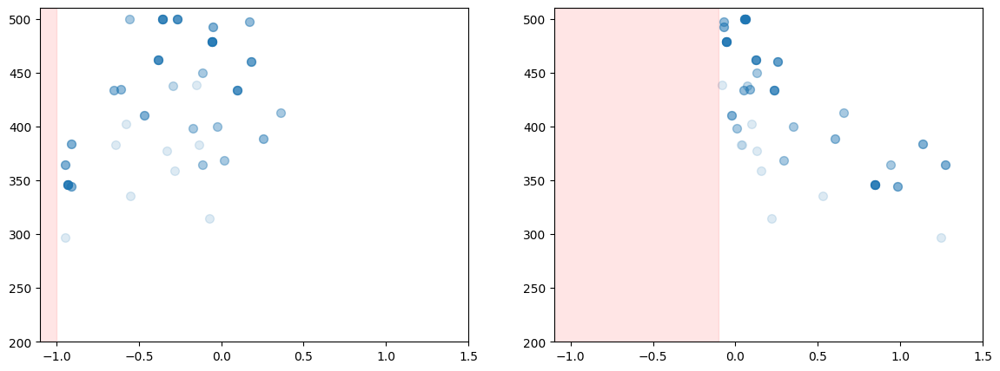

In [130]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].scatter((best_solutions_anm_w.reshape(-1, 2)[:, 0] - 1), best_fitnesses_anm_w.reshape(150), alpha = 0.15, s=50)
ax[1].scatter((best_solutions_anm_w.reshape(-1, 2)[:, 1] - 0.1), best_fitnesses_anm_w.reshape(150), alpha = 0.15, s=50)
ax[0].set_xlim(-1.1, 1.5)
ax[1].set_xlim(-1.1, 1.5)
ax[0].set_ylim(200, 510)
ax[1].set_ylim(200, 510)
ax[0].fill_betweenx([200, 510], -2, -1, color='red', alpha=0.1)
ax[1].fill_betweenx([200, 510], -2, -0.1, color='red', alpha=0.1)


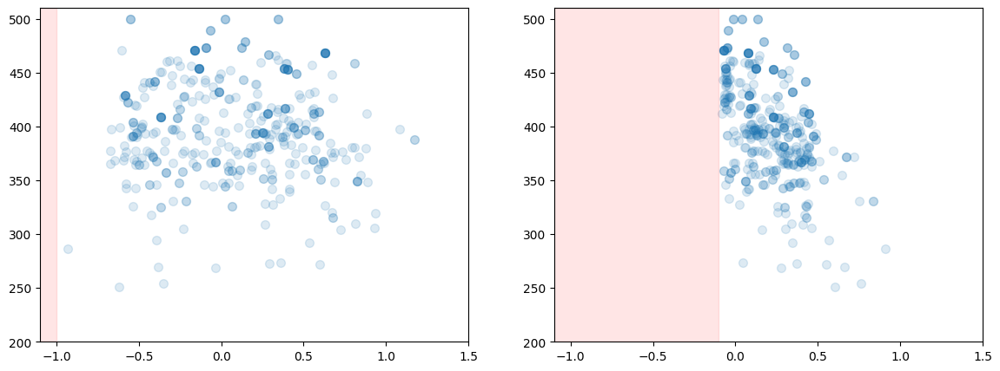

In [131]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].scatter((solutions_anm_d.reshape(-1, 2)[:, 0] - 1), fitnesses_anm_d.reshape(450), alpha = 0.15, s=50)
ax[1].scatter((solutions_anm_d.reshape(-1, 2)[:, 1] - 0.1), fitnesses_anm_d.reshape(450), alpha = 0.15, s=50)
ax[0].set_xlim(-1.1, 1.5)
ax[1].set_xlim(-1.1, 1.5)
ax[0].set_ylim(200, 510)
ax[1].set_ylim(200, 510)
ax[0].fill_betweenx([200, 510], -2, -1, color='red', alpha=0.1)
ax[1].fill_betweenx([200, 510], -2, -0.1, color='red', alpha=0.1)


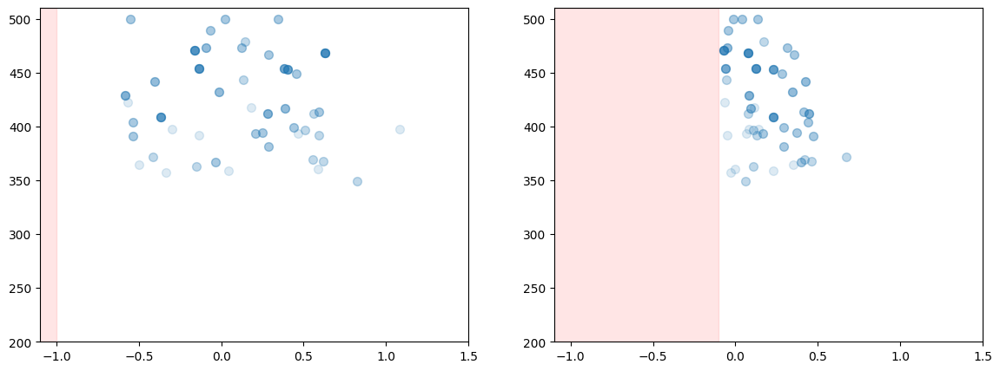

In [132]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].scatter((best_solutions_anm_d.reshape(-1, 2)[:, 0] - 1), best_fitnesses_anm_d.reshape(150), alpha = 0.15, s=50)
ax[1].scatter((best_solutions_anm_d.reshape(-1, 2)[:, 1] - 0.1), best_fitnesses_anm_d.reshape(150), alpha = 0.15, s=50)
ax[0].set_xlim(-1.1, 1.5)
ax[1].set_xlim(-1.1, 1.5)
ax[0].set_ylim(200, 510)
ax[1].set_ylim(200, 510)
ax[0].fill_betweenx([200, 510], -2, -1, color='red', alpha=0.1)
ax[1].fill_betweenx([200, 510], -2, -0.1, color='red', alpha=0.1)

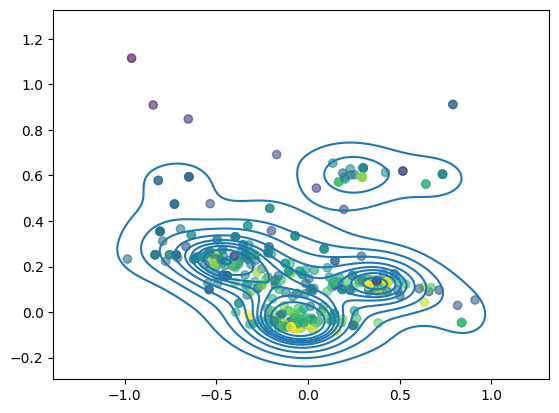

In [233]:
_ = sns.kdeplot(x=(solutions_nm.reshape(-1, 2)[:, 0] - 1), y=(solutions_nm.reshape(-1, 2)[:, 1] - 0.1))
_ = plt.scatter((solutions_nm.reshape(-1, 2)[:, 0] - 1), (solutions_nm.reshape(-1, 2)[:, 1] - 0.1), c=fitnesses_nm.reshape(450), cmap='viridis', alpha=0.6)

In [10]:
all_points = np.vstack([solutions_inm.reshape(-1, 2)])
all_fitnesses = np.vstack([fitnesses_inm.reshape(-1, 1)])
all_rewards = np.vstack([rewards_inm.reshape(-1, 1)])
# all_points = solutions_nm.reshape(-1, 2)
# rewards = rewards_nm.reshape(-1, 1)

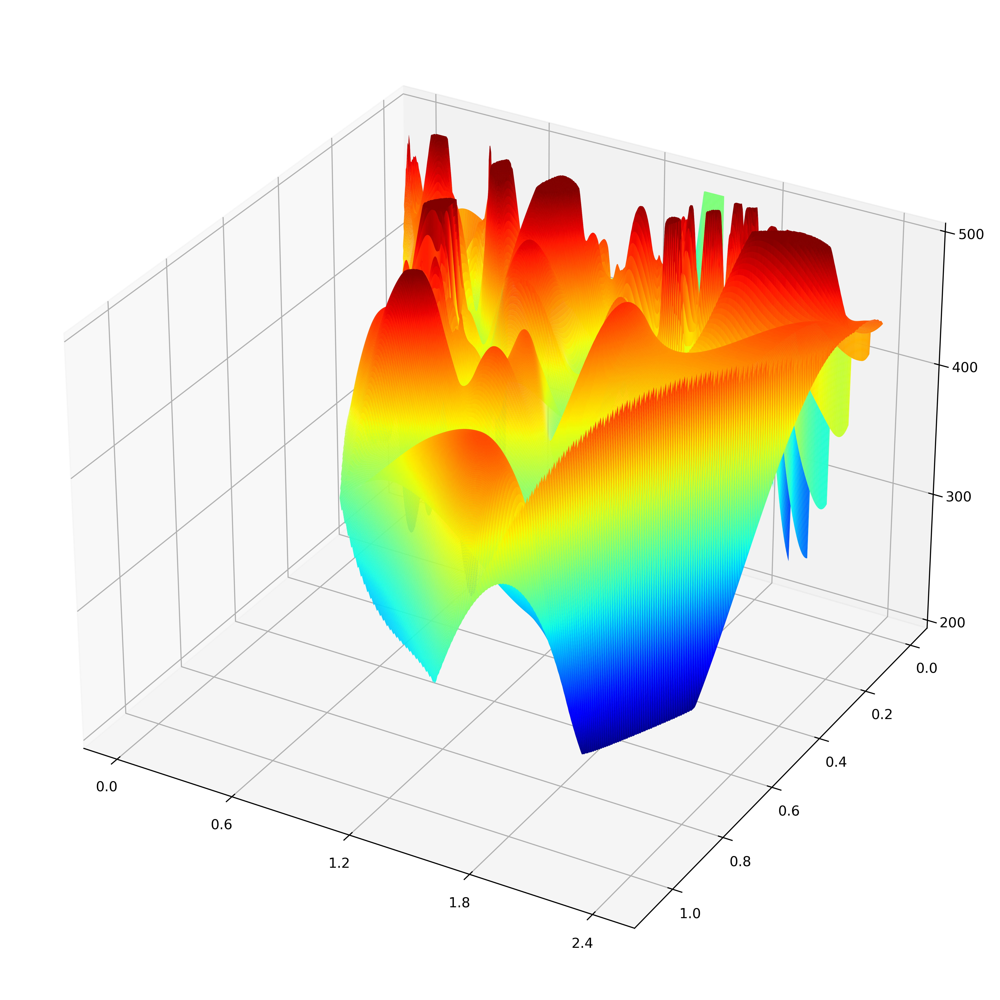

In [11]:
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib import cm
from scipy.interpolate import griddata
cma = 'jet'


Xs = all_points[:,0]
Ys = all_points[:,1]
Zs_fitness = all_fitnesses[:, 0]
Zs_rewards = all_rewards[:, 0]
points = np.array([Xs, Ys]).T

X_grid, Y_grid = np.mgrid[min(Xs):max(Xs):500j, min(Ys):max(Ys):500j]
# interpolate your values on the grid defined above
Z_grid_fitness = griddata(points, Zs_fitness, (X_grid, Y_grid), method='cubic', rescale=True)
Z_grid_rewards = griddata(points, Zs_rewards, (X_grid, Y_grid), method='cubic', rescale=True)
Z_grid_fitness[Z_grid_fitness > 500] = 500
Z_grid_fitness[Z_grid_fitness < 200] = 200
Z_grid_rewards[Z_grid_rewards > 500] = 500
Z_grid_rewards[Z_grid_rewards < 200] = 200

fig = plt.figure(constrained_layout=True, figsize=(10, 10), dpi=500)
ax = fig.add_subplot(111, projection='3d')

surf = ax.plot_surface(X_grid, Y_grid, Z_grid_fitness, cmap=cma, 
                       linewidth=0, antialiased=True, rstride=1, cstride=1)
# ax.scatter(Xs, Ys, Zs, c=Zs, cmap=cma, s=15)
ax.xaxis.set_major_locator(MaxNLocator(5))
ax.yaxis.set_major_locator(MaxNLocator(6))
ax.zaxis.set_major_locator(MaxNLocator(3))
ax.yaxis.set_inverted(True)
plt.show()

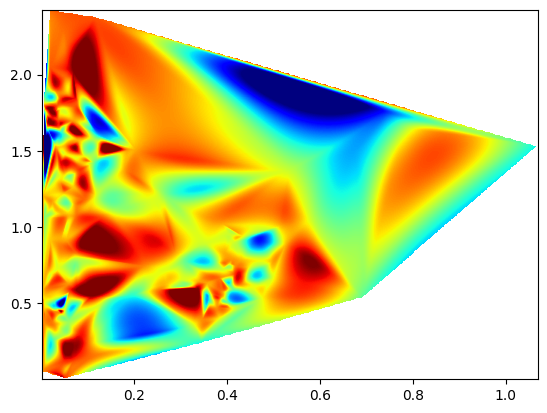

In [12]:
# fig, ax = plt.subplots(1, 1, dpi=500)
plt.imshow(Z_grid_fitness, extent=[min(Ys), max(Ys), min(Xs), max(Xs)], origin='lower', cmap=cma, aspect='auto')
# ax[1].imshow(Z_grid_rewards, extent=[min(Ys), max(Ys), min(Xs), max(Xs)], origin='lower', cmap=cma, aspect='auto')

In [10]:
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler with feature range [-1, 1]
scaler = MinMaxScaler(feature_range=(-1, 1))

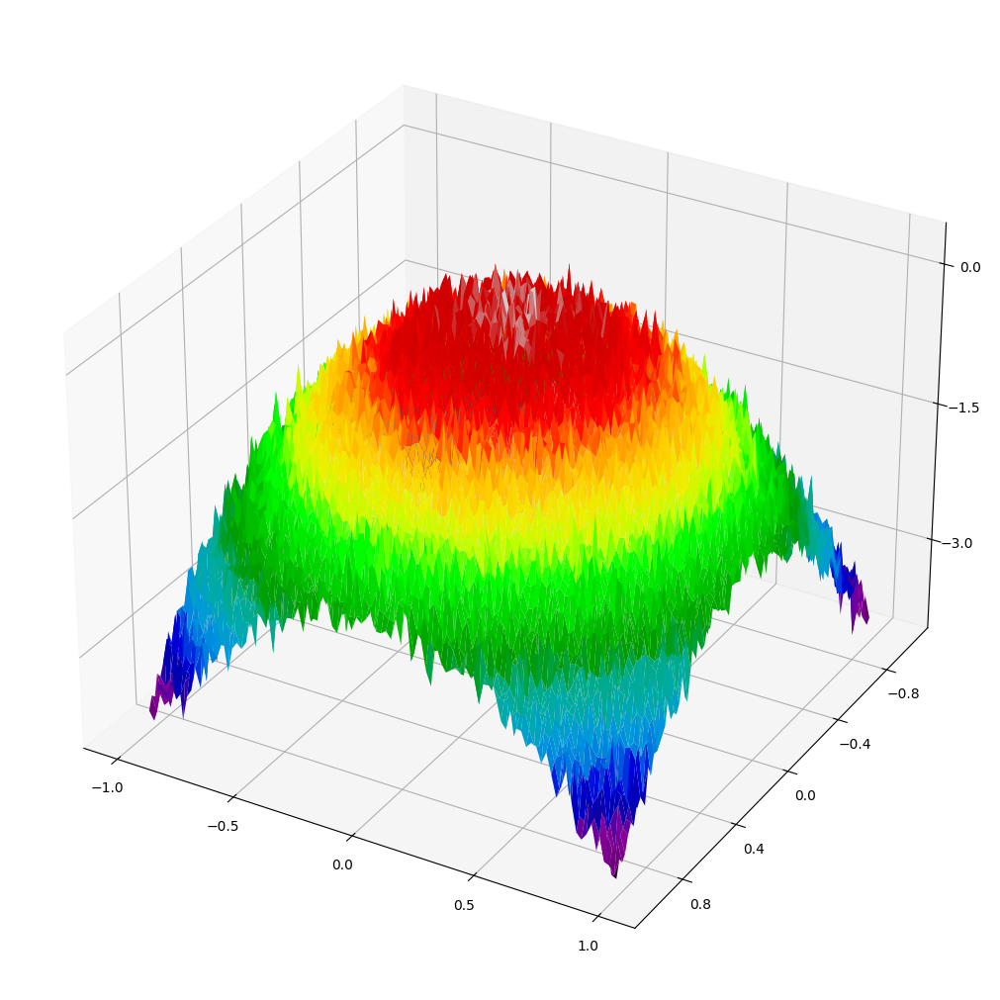

In [15]:
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib import cm
from scipy.interpolate import griddata


Xs = scaler.fit_transform(np.random.random(2000).reshape(-1, 1)).reshape(-1)
Ys = scaler.fit_transform(np.random.random(2000).reshape(-1, 1)).reshape(-1)
Zs = -(Xs**2) -(Ys**2)
points = np.array([Xs, Ys]).T

X_grid, Y_grid = np.mgrid[min(Xs):max(Xs):100j, min(Ys):max(Ys):100j]
# interpolate your values on the grid defined above
Z_grid = griddata(points, Zs, (X_grid, Y_grid), method='cubic', rescale=True)
Z_grid += Z_grid + np.random.multivariate_normal(np.zeros(100), np.eye(100)/40, 100)

fig = plt.figure(constrained_layout=True, figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

surf = ax.plot_surface(X_grid, Y_grid, Z_grid, cmap='nipy_spectral', 
                       linewidth=0, antialiased=True, rstride=1, cstride=1)
ax.xaxis.set_major_locator(MaxNLocator(5))
ax.yaxis.set_major_locator(MaxNLocator(6))
ax.zaxis.set_major_locator(MaxNLocator(3))
ax.yaxis.set_inverted(True)
plt.show()

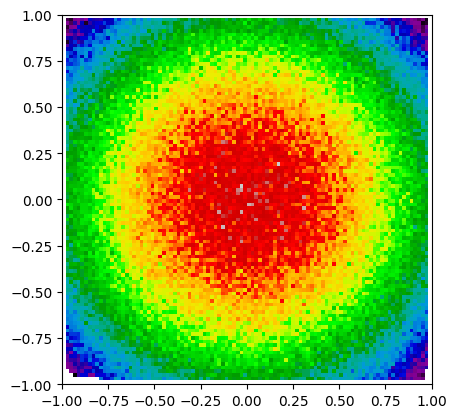

In [16]:
plt.imshow(Z_grid, extent=[min(Xs), max(Xs), min(Ys), max(Ys)], origin='lower', cmap='nipy_spectral')